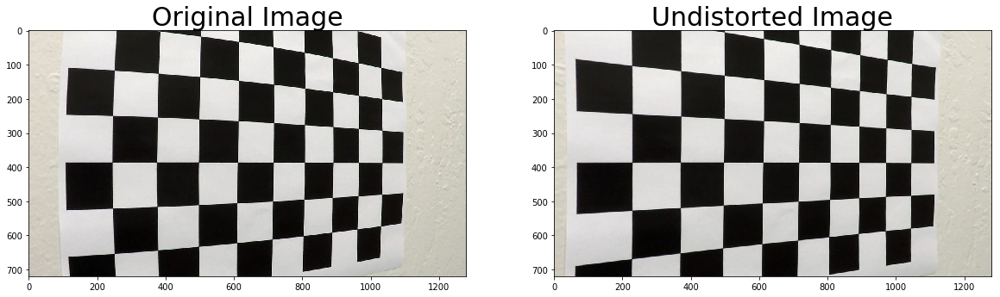

In [1]:
#Camera Calibration

import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib qt
%matplotlib inline

# Visualize two images side by side
def visualize(img1, img2, text1, text2):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    if len(img1.shape)==2:
        ax1.imshow(img1, cmap='gray')    
    if len(img1.shape)==3:
        ax1.imshow(img1)
    
    ax1.set_title(text1, fontsize=30)
    
    if len(img2.shape)==2:
        ax2.imshow(img2, cmap='gray')    
    if len(img2.shape)==3:
        ax2.imshow(img2)
        
    ax2.set_title(text2, fontsize=30)

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images from the directory camera_cal
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

img = mpimg.imread('camera_cal/calibration5.jpg')
dst = cv2.undistort(img, mtx, dist, None, mtx)
visualize(img,dst,"Original Image", "Undistorted Image")

In [2]:
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

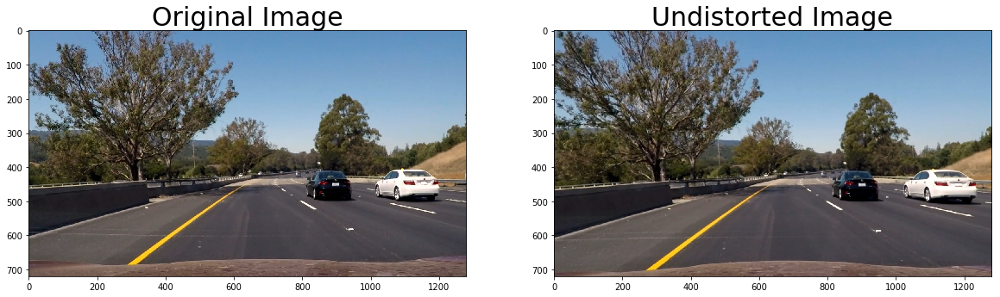

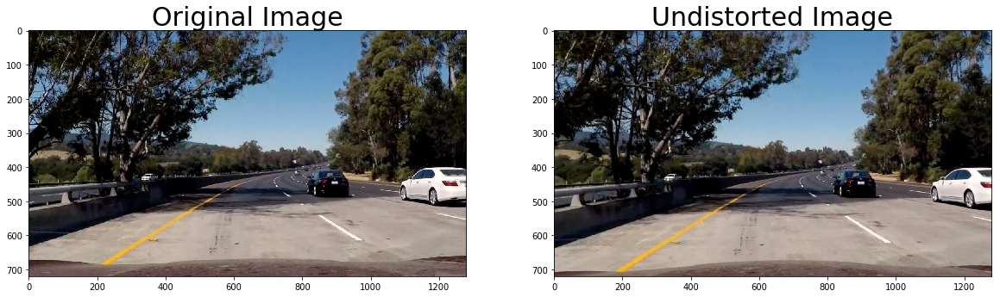

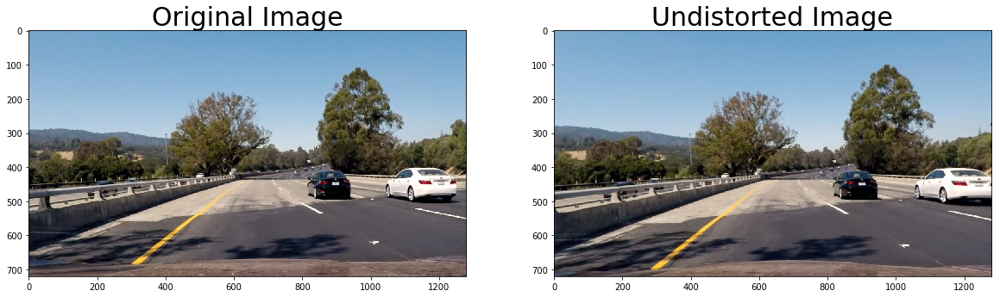

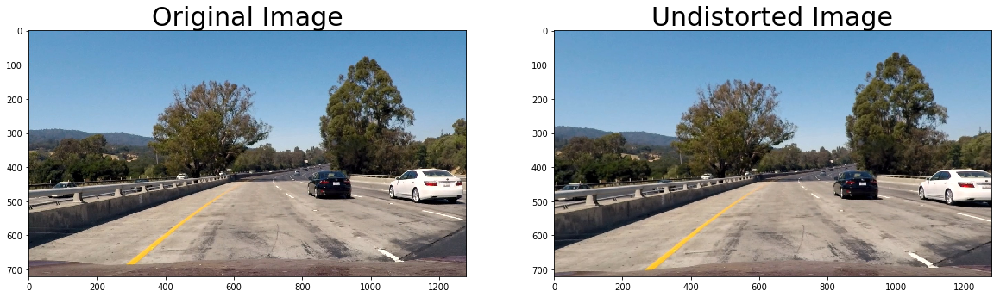

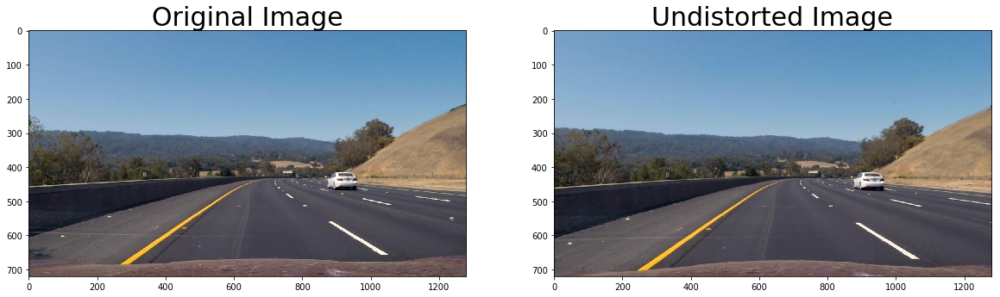

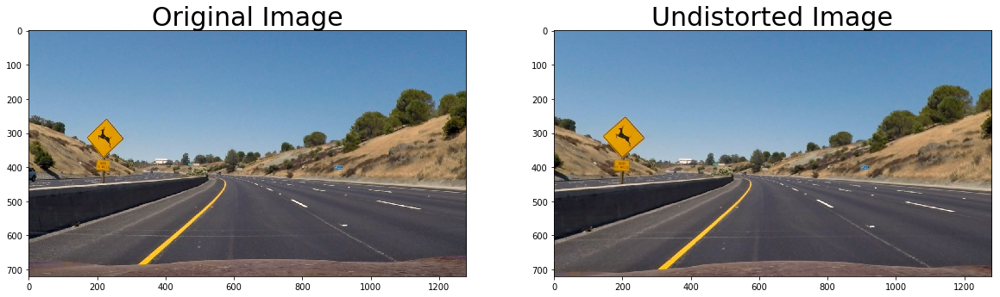

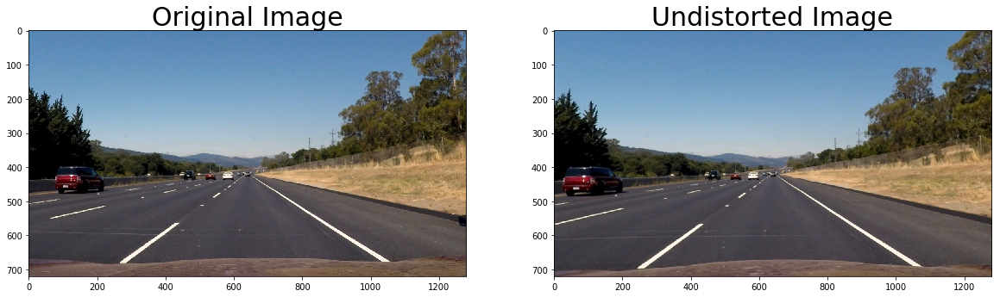

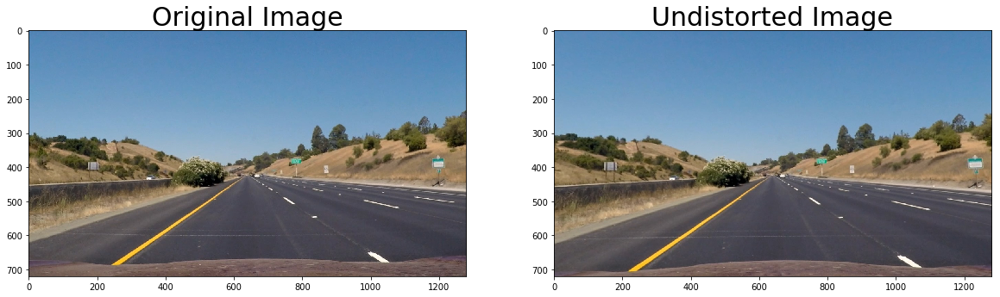

In [3]:
# Test undistortion on an image
test_images = glob.glob('test_images/*.jpg')
original_imgs = []
undistorted_imgs = []

for idx, fname in enumerate(test_images):
    img = mpimg.imread(fname)
    original_imgs.append(img)
    img_size = (img.shape[1], img.shape[0])

    dst = cv2.undistort(img, mtx, dist, None, mtx)
    undistorted_imgs.append(dst)
    # Visualize undistortion
    visualize(img, dst, 'Original Image', 'Undistorted Image')

In [4]:
# Define a function that applies Sobel x or y, 
# then takes an absolute value and applies a threshold.
# Note: calling your function with orient='x', thresh_min=5, thresh_max=100
# should produce output like the example image shown above this quiz.
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Apply the following steps to img
    # 1) Convert to grayscale
    if len(img.shape) ==3:
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    else:
        gray = img

    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient=='x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    if orient == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)

    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))

    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    # 6) Return this mask as your binary_output image
    return binary_output

In [5]:
# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Apply the following steps to img
    # 1) Convert to grayscale
    if len(img.shape) ==3:
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    else:
        gray = img

    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # 3) Calculate the magnitude 
    magnitude = np.sqrt(sobelx**2+sobely**2)
    
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*magnitude/np.max(magnitude))

    # 5) Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1

    # 6) Return this mask as your binary_output image
    return binary_output

In [6]:
# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag(img, sobel_kernel=3):
    # Apply the following steps to img
    # 1) Convert to grayscale
    if len(img.shape) ==3:
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    else:
        gray = img

    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # 3) Calculate the magnitude 
    magnitude = np.sqrt(sobelx**2+sobely**2)
    
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*magnitude/np.max(magnitude))

    return scaled_sobel

In [7]:
# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    if len(img.shape) ==3:
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    else:
        gray = img
        
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)

    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)

    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    direction = np.arctan2(abs_sobely, abs_sobelx)
    
    # 5) Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(direction)
    binary_output[(direction >= thresh[0]) & (direction <= thresh[1])] = 1

    # 6) Return this mask as your binary_output image
    return binary_output

In [8]:
# Define a function that thresholds the S-channel of HLS
# Use exclusive lower bound (>) and inclusive upper (<=)
def hls_select(img, thresh=(0, 255)):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)

    # 2) Apply a threshold to the S channel
    S = hls[:,:,2]
    binary_output = np.zeros_like(S)
    binary_output[(S > thresh[0]) & (S <= thresh[1])] = 1
    
    # 3) Return a binary image of threshold result
    return binary_output

In [9]:
def binary_output(input, threshold):
    binary_output = np.zeros_like(input)
    input = np.absolute(input)
    scaled_input = np.uint8(255*input/np.max(input))
    binary_output[(input > threshold[0]) & (input <= threshold[1])] = 1
    return binary_output

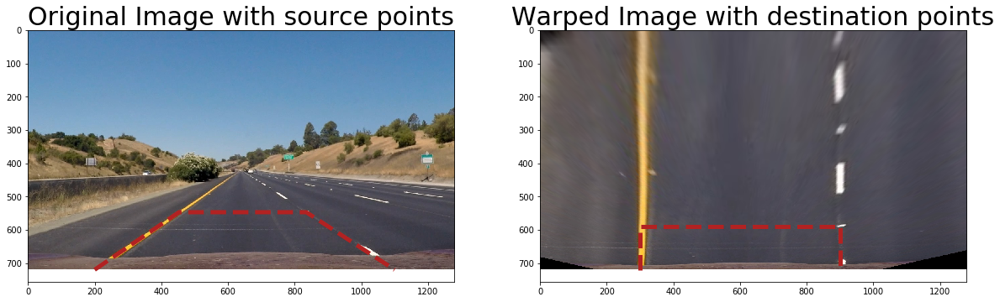

In [10]:
# For source points I'm grabbing the outer four detected corners
src = np.float32([[200. , 720, ],[453. , 547.],[835. , 547. ],[1100. , 720. ]])

# For destination points, I'm arbitrarily choosing some points to be
# a nice fit for displaying our warped result 
dst = np.float32([[300., 720],[300. , 590.4],[900., 590.4],[900. , 720]])

# Given src and dst points, calculate the perspective transform matrix
M = cv2.getPerspectiveTransform(src, dst)
Minv = cv2.getPerspectiveTransform(dst, src)

def warper(img):
    return cv2.warpPerspective(img, M, (1280,720), flags = cv2.INTER_LINEAR)

img = mpimg.imread('test_images/straight_lines1.jpg')
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))

ax1.imshow(img)
ax1.plot([200,453,835,1100],[720,547,547,720], '--',linewidth=5, color='firebrick')
ax1.set_title("Original Image with source points", fontsize=30)

ax2.imshow(warper(img))
ax2.plot([300,300,900,900],[720,590.4,590.4,720], '--',linewidth=5, color='firebrick')
ax2.set_title("Warped Image with destination points", fontsize=30)

In [11]:
def pipeline(img):
    img = np.copy(img)
    
    mask = np.array([[170,720], [620,420], [670,420],[1200,720]])
    
    # Convert to HLS color space and separate the V channel
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    luv = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)

    hsv_s = hsv[:,:,1]
    hsv_v = hsv[:,:,2]
    luv_l = luv[:,:,0]
    hls_s = hls[:,:,1]
    
    binary_hsv_s = binary_output(hsv_s, threshold=(120,255))
    binary_hsv_v = binary_output(hsv_v, threshold=(120,255))
    binary_luv_l = binary_output(luv_l, threshold=(205,255))
    
    mag_hsv_v = mag(hsv[:,:,2], sobel_kernel=5)
    binary_mag_hsv_v = binary_output(mag_hsv_v, threshold=(50,255))
    
    mag_hsv_v = mag(hsv[:,:,2], sobel_kernel=3)
    binary_mag_hsv_v = binary_output(mag_hsv_v, threshold=(50,255))
    hsv_s_dir = dir_threshold(hsv[:,:,1], sobel_kernel=15, thresh=(0.7, 1.3))
    
    combined = np.zeros_like(binary_hsv_s)
    combined[((hsv_s_dir==1)&(binary_hsv_s==1))|((binary_hsv_v==1)&(binary_mag_hsv_v==1))] = 1
    
    combined_binary = np.zeros_like(hsv_s)
    combined_binary[(( (combined == 1) | (binary_mag_hsv_v ==1)) |(binary_luv_l == 1))] = 1

    masked = region_of_interest(combined_binary, [mask])
    return masked

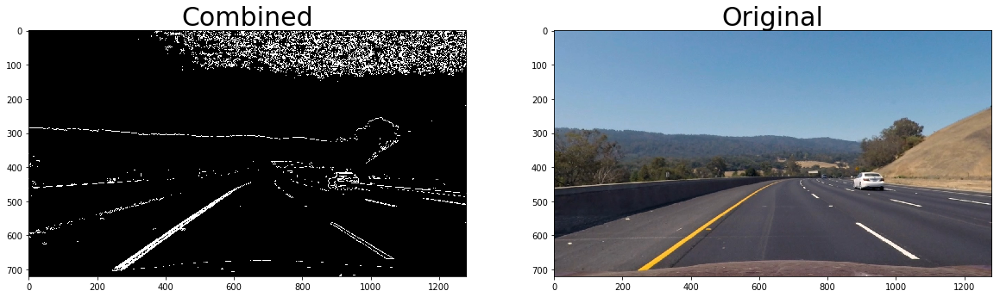

In [12]:
def test_pipeline(image):
    ksize = 9
    
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    luv = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
    lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
    
    #visualize(image, hsv[:,:,0], 'Original Image', 'HSV H Channel')
    #visualize(hsv[:,:,1], hsv[:,:,2], 'HSV S Channel', 'HSV V Channel')

    #visualize(image, luv[:,:,0], 'Original Image', 'LUV L Channel')
    #visualize(luv[:,:,1], luv[:,:,2], 'LUV U Channel', 'LUV V Channel')

    #visualize(image, hls[:,:,0], 'Original Image', 'HLS H Channel')
    #visualize(hls[:,:,1], hls[:,:,2], 'HLS L Channel', 'HLS S Channel')
        
    #visualize(image, lab[:,:,0], 'Original Image', 'LAB L Channel')
    #visualize(lab[:,:,1], lab[:,:,2], 'LAB A Channel', 'LAB B Channel')
    
    binary_hsv_s = binary_output(hsv[:,:,1], threshold=(120,255))
    binary_hsv_v = binary_output(hsv[:,:,2], threshold=(120,255))
    
    mag_hsv_v = mag(hsv[:,:,2], sobel_kernel=3)
    binary_mag_hsv_v = binary_output(mag_hsv_v, threshold=(50,255))
    hsv_s_dir = dir_threshold(hsv[:,:,1], sobel_kernel=15, thresh=(0.7, 1.3))
    
    combined_binary = np.zeros_like(binary_hsv_s)
    combined_binary[((hsv_s_dir==1)&(binary_hsv_s==1))|((binary_hsv_v==1)&(binary_mag_hsv_v==1))] = 1

    #visualize(hsv_s_dir, hsv[:,:,1] , "Direction HSV S Channel", "HSV S Channel")                          
    #visualize(binary_hsv_s, hsv[:,:,1] , "Binary HSV S Channel", "HSV S Channel")
    
    #visualize(binary_hsv_v, hsv[:,:,2] , "Binary HSV V Channel", "HSV V Channel")
    #visualize(binary_mag_hsv_v, mag_hsv_v , "Binary Mag Binary HSV V Channel", "Mag Binary HSV V Channel")

    visualize(combined_binary, image , "Combined", "Original")
    
    #This is good for detecting white lines in all conditions
    #visualize(binary_output(luv[:,:,0], threshold=(205,255)),luv[:,:,0] , "Binary LUV L Channel", "LUV L Channel")
    #visualize(binary_output(luv[:,:,0], threshold=(205,255)),image , "Binary LUV L Channel", "Original")
    
test_pipeline(undistorted_imgs[4])

#for img in undistorted_imgs:
#    test_pipeline(img)

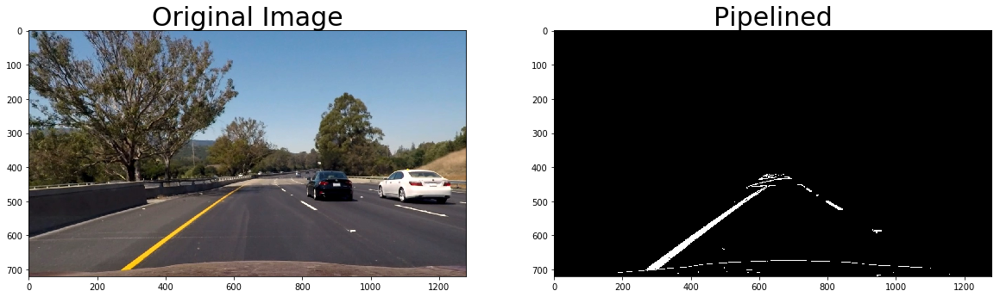

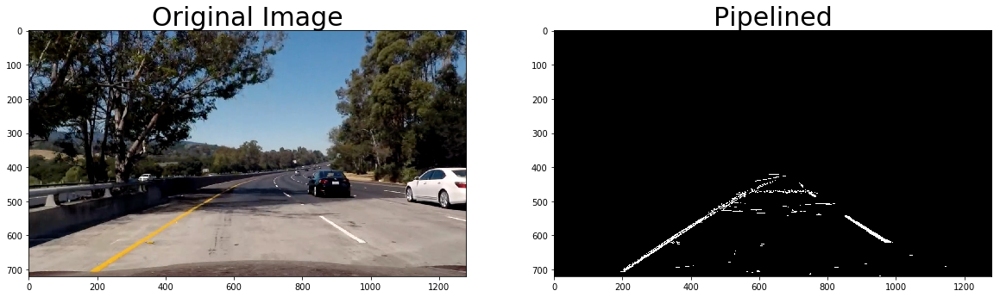

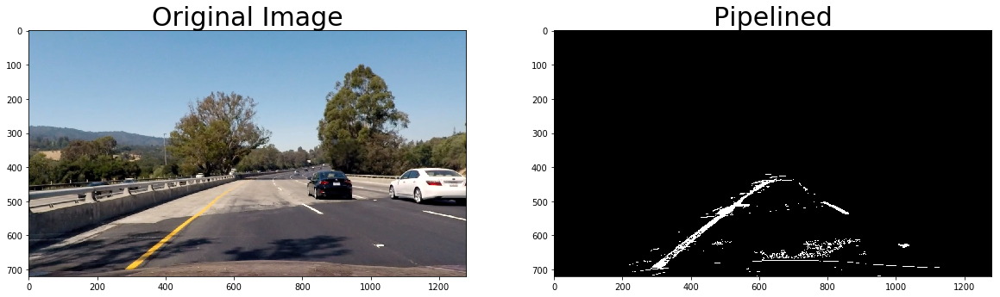

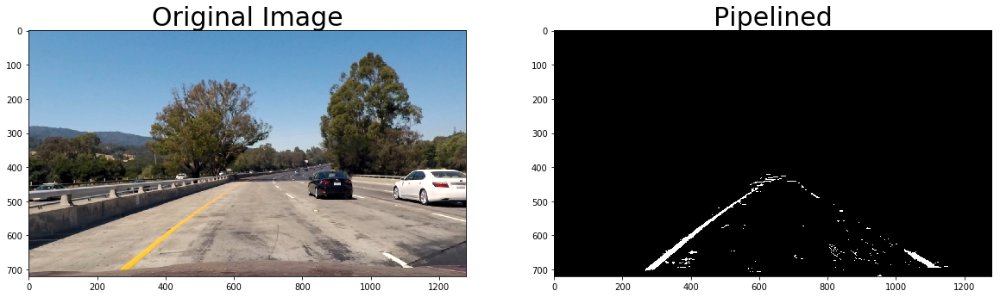

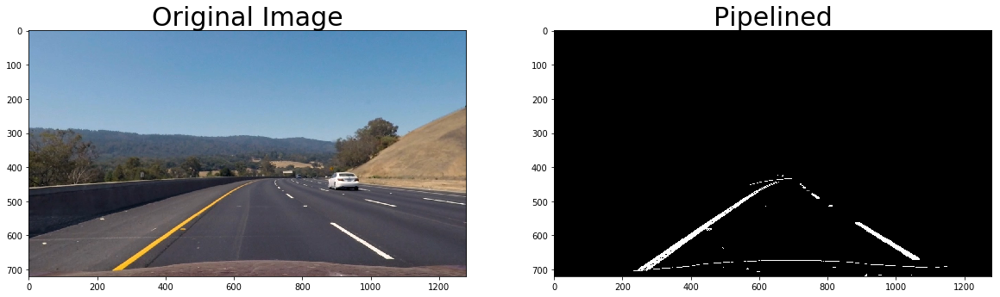

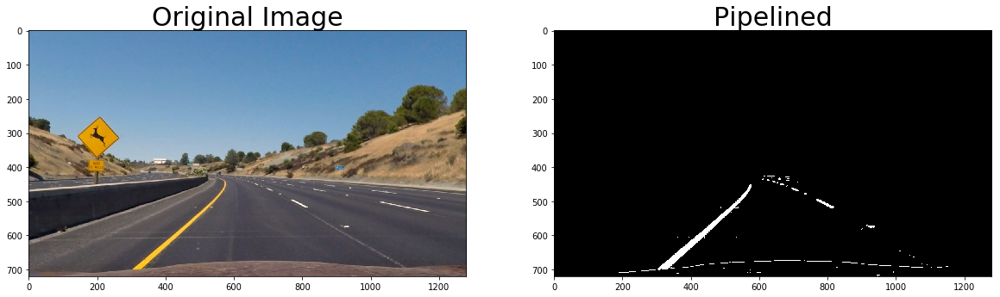

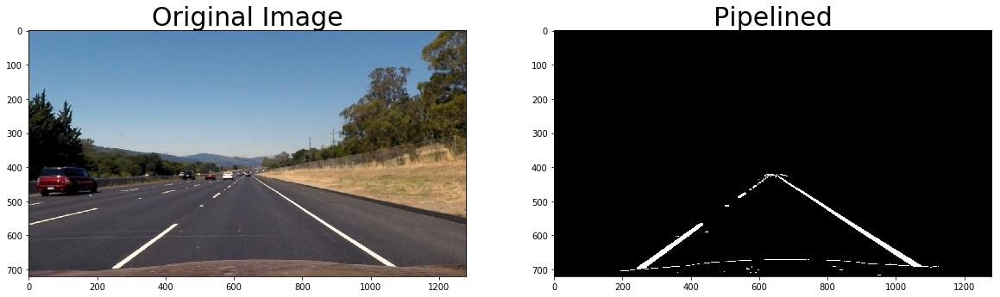

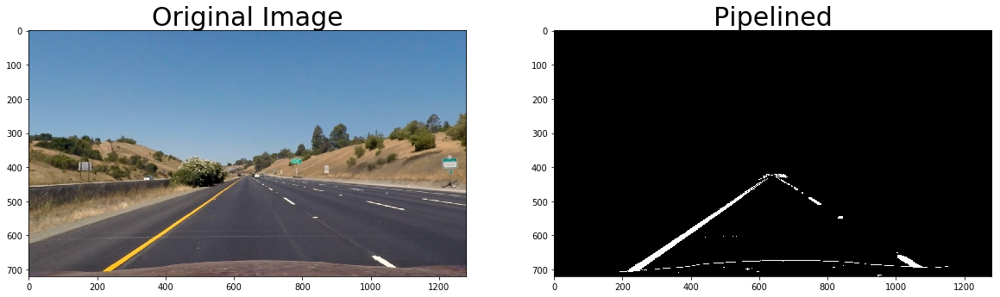

In [13]:
process = []
for img in undistorted_imgs:
    processed = pipeline(img)
    process.append(processed)
    visualize(img, processed, 'Original Image', 'Pipelined')

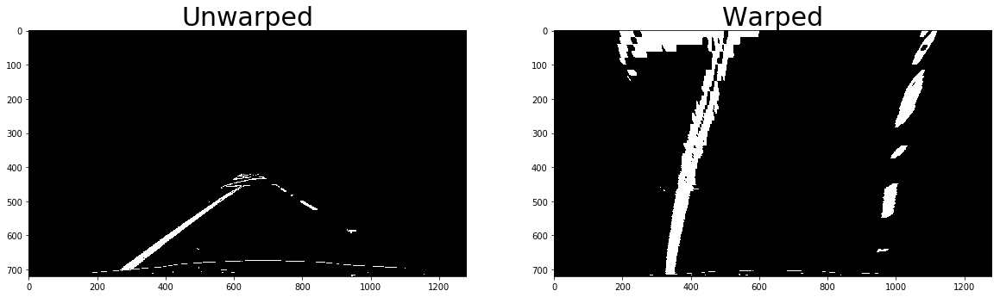

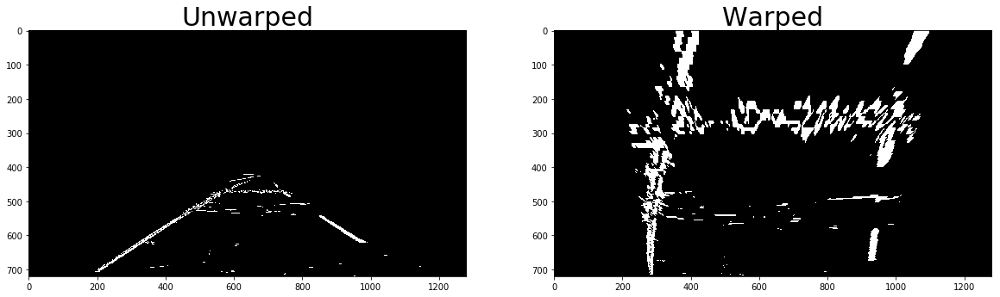

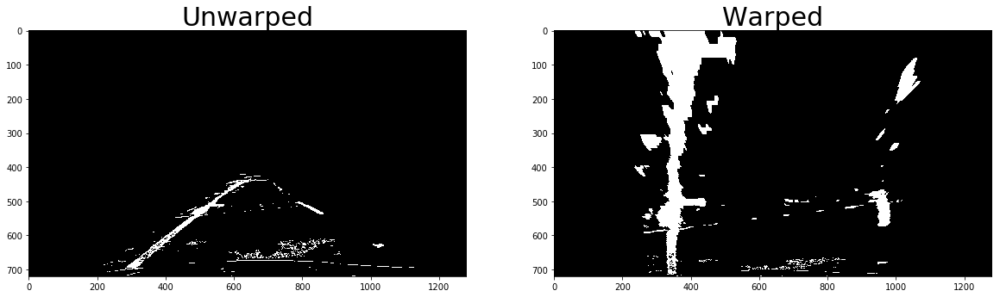

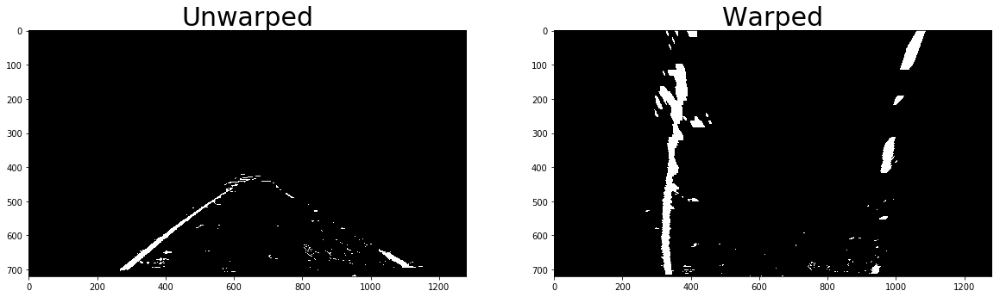

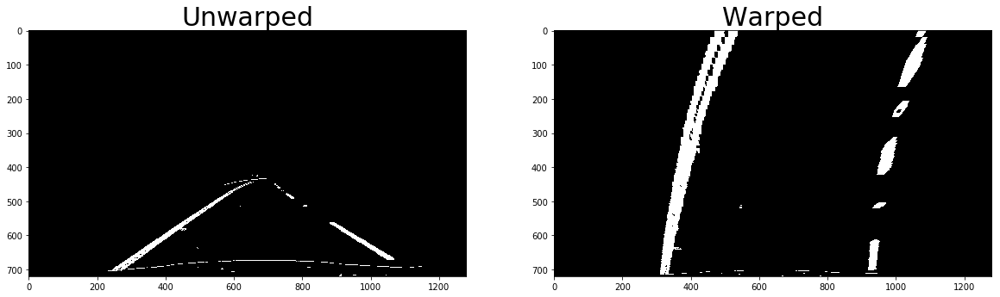

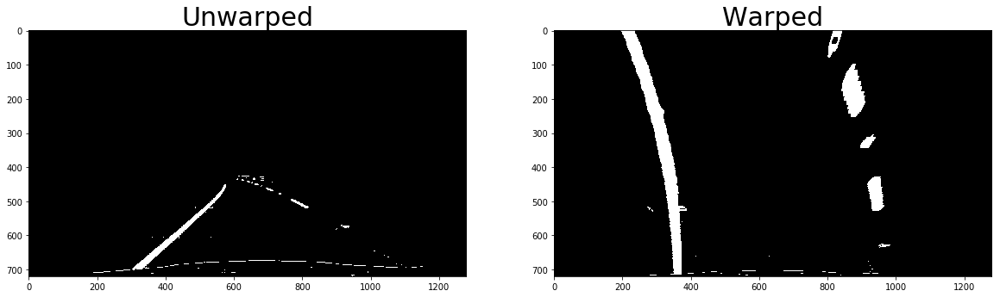

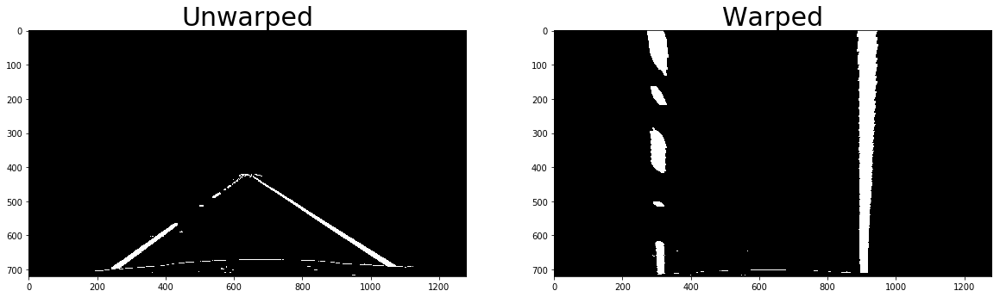

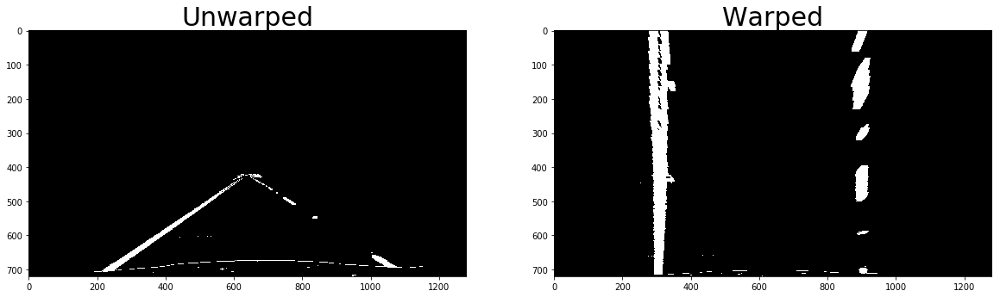

In [14]:
warped_imgs = []
for img in process:
    warped = cv2.warpPerspective(img, M, (1280,720), flags = cv2.INTER_LINEAR)
    warped_imgs.append(warped)
    visualize(img, warped, "Unwarped", "Warped")


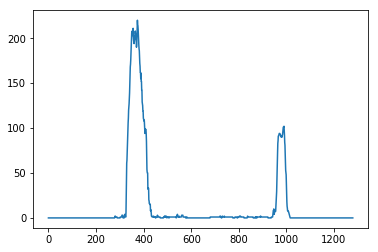

In [15]:
img = warped_imgs[0]
histogram = np.sum(img[img.shape[0]//2:,:], axis=0)
plt.plot(histogram)

In [16]:
def getPolynomial(binary_warped):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    return left_lane_inds, right_lane_inds, left_fit, right_fit

In [17]:
def visualizeSlidingWindow(left_lane_inds,right_lane_inds, left_fitx, right_fitx):
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    plt.imshow(out_img)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)

In [18]:
def getCurvature(ploty, left_fitx, right_fitx):
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    # Now our radius of curvature is in meters
    if left_curverad>right_curverad:
        return "Radius of Curavture is  Right :" + "{0:.2f}".format(right_curverad)
    else:
        return "Radius of Curavture is  Left: "+ "{0:.2f}".format(left_curverad)

In [19]:
# from https://discussions.udacity.com/t/what-the-vehicle-position-with-respect-to-center-means/375281/4
def getCarPosition(ploty, left_fitx, right_fitx):
    y_max = np.max(ploty)
    
    left = left_fit[0]*y_max**2 + left_fit[1]*y_max + left_fit[2]
    right = right_fit[0]*y_max**2 + right_fit[1]*y_max + right_fit[2]
    
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    midpoint =  (left + right)/2
    offset = xm_per_pix*(midpoint-640)
    
    if offset<0.:
        return "Vehicle is "+"{0:.2f}".format(offset*-1)+ " m left from centre"
    else:
        return "Vehicle is "+"{0:.2f}".format(offset)+ " m right from centre"

In [20]:
def map_lane(undist, warped, ploty, left_fitx, right_fitx):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (undist.shape[1], undist.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    cv2.putText(result,getCurvature(ploty, left_fitx, right_fitx), (30, 60), cv2.FONT_HERSHEY_SIMPLEX, 1.5, [255,255,255],2)
    cv2.putText(result,getCarPosition(ploty, left_fitx, right_fitx), (30, 150), cv2.FONT_HERSHEY_SIMPLEX, 1.5, [255,255,255],2)

    return result

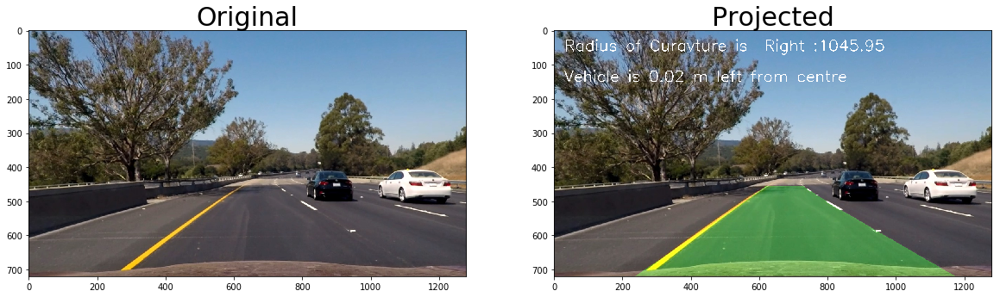

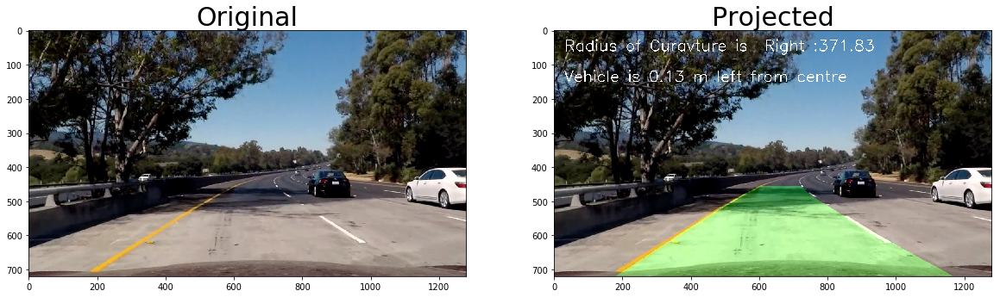

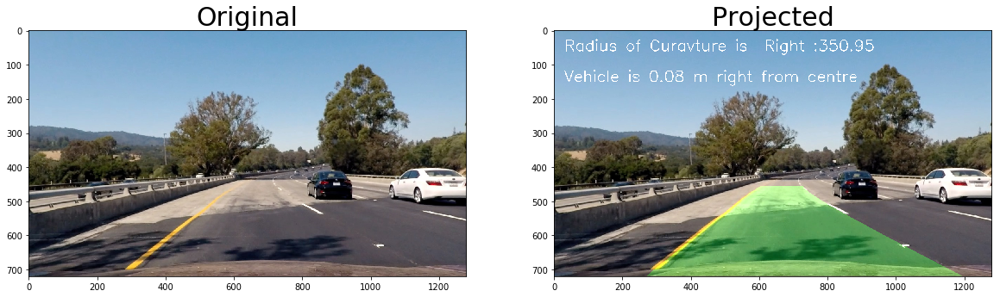

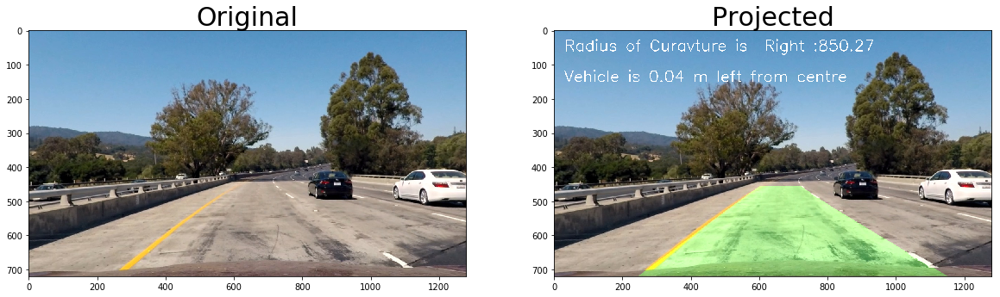

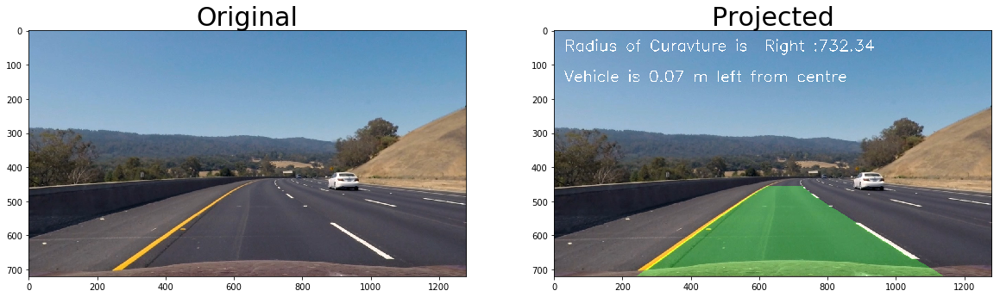

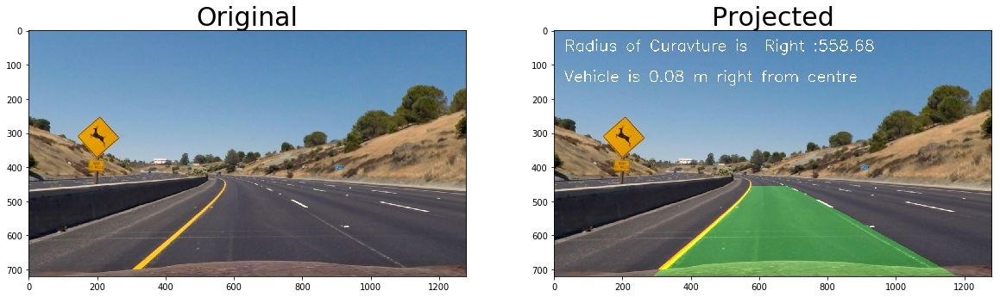

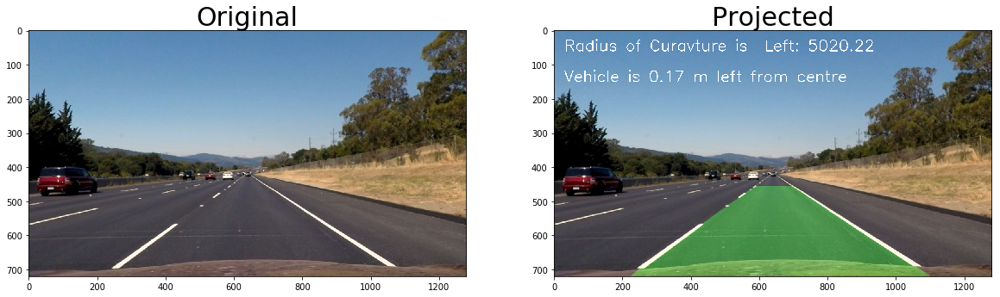

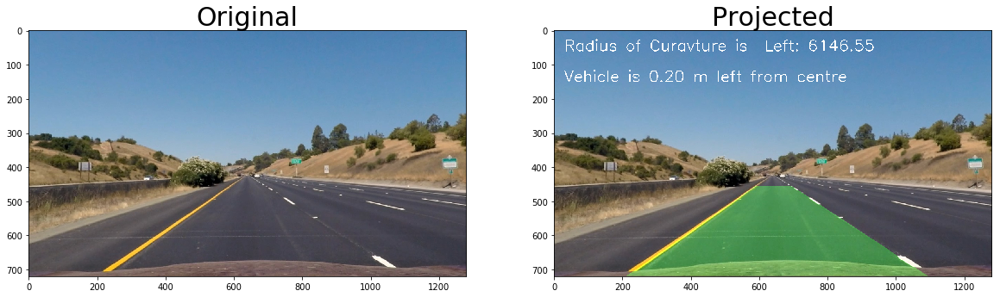

In [21]:
for binary_warped, image in zip(warped_imgs,undistorted_imgs):
    undist = image    
    left_lane_inds, right_lane_inds, left_fit, right_fit  = getPolynomial(binary_warped)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
                                                                       
    projImage = map_lane(undist, binary_warped, ploty, left_fitx, right_fitx)
    visualize(image, projImage, "Original", "Projected")

In [ ]:
def process_image(image):
    undistorted = cv2.undistort(image, mtx, dist, None, mtx)
    pipelined = pipeline(undistorted)
    warped = cv2.warpPerspective(pipelined, M, (1280,720), flags = cv2.INTER_LINEAR)
    left_lane_inds, right_lane_inds, left_fit, right_fit  = getPolynomial(warped)

    # Generate x and y values for plotting
    ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    result = map_lane(undistorted, warped, ploty, left_fitx, right_fitx)
    return result

In [ ]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

video_output = 'output_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
#clip1 = VideoFileClip("project_video.mp4").subclip(0,5)
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(video_output, audio=False)

In [ ]:
video_output = 'output_challenge_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
#clip1 = VideoFileClip("project_video.mp4").subclip(0,5)
clip1 = VideoFileClip("challenge_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(video_output, audio=False)